In [ ]:
pip install --upgrade bitsandbytes --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 14.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import sys
import subprocess
import random
import urllib.request
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from diffusers import StableDiffusion3Pipeline, BitsAndBytesConfig, SD3Transformer2DModel
import nltk
from nltk.corpus import wordnet as wn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pickle
import json
import re
from tqdm.auto import tqdm
import seaborn as sns
import warnings
import gc

warnings.filterwarnings('ignore')
print("🚀 Librerie caricate con successo!")

2025-06-29 09:47:29.186902: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751190449.343181      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751190449.390029      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


🚀 Librerie caricate con successo!


In [3]:
def setup_huggingface_auth():
    try:
        from kaggle_secrets import UserSecretsClient
        hf_token = UserSecretsClient().get_secret("HUGGINGFACE_TOKEN")
        if hf_token:
            print("✅ Token Hugging Face trovato nei Kaggle Secrets")
            return hf_token
    except ImportError:
        print("❌ Token Hugging Face non trovato!")
    return None

def authenticate_huggingface():
    token = setup_huggingface_auth()
    if token:
        try:
            from huggingface_hub import login
            login(token=token, add_to_git_credential=False)
            print("🔐 Autenticazione Hugging Face completata!")
            return True
        except Exception as e:
            print(f"❌ Errore nell'autenticazione: {e}")
    return False

In [4]:
class ProjectConfig:
    
    DIFFUSION_MODEL = "stabilityai/stable-diffusion-3.5-large"
    IMAGE_SIZE = (512, 512)
    NUM_INFERENCE_STEPS = 28
    GUIDANCE_SCALE = 8.0

    CNN_MODEL = "resnet50"
    BATCH_SIZE = 16

    CORE_WORDNET_URL = "https://wordnetcode.princeton.edu/standoff-files/core-wordnet.txt"
    MAX_SYNSETS = 5
    MIN_SYNSETS_REQUIRED = 3

    BIAS_ANALYSIS_CLASSES = [
        'bee',       
        'frog',      
        'plane',
        'guitar',    
        'strawberry'
    ]
    
    TOP_K_ACTIVATIONS = 10
    TOP_K_SYNSETS_PER_LAYER = 3
    LAYER_TO_ANALYZE = "layer4"
    
    VISUALIZATION_MAX_IMAGES = 2
    REPORT_TOP_LAYERS = 8
    TOP_K_PROMPTS = 8
    
    DATA_DIR = "/kaggle/working/cnn_interpretability_data"
    IMAGES_DIR = os.path.join(DATA_DIR, "generated_images")
    RESULTS_DIR = os.path.join(DATA_DIR, "results")
    BIAS_RESULTS_DIR = os.path.join(DATA_DIR, "bias_analysis")

config = ProjectConfig()
os.makedirs(config.DATA_DIR, exist_ok=True)
os.makedirs(config.IMAGES_DIR, exist_ok=True)
os.makedirs(config.RESULTS_DIR, exist_ok=True)
os.makedirs(config.BIAS_RESULTS_DIR, exist_ok=True)

print(f"📁 Directory di lavoro: {config.DATA_DIR}")
print(f"🔢 Max synsets: {config.MAX_SYNSETS}")
print(f"🎯 Classi bias: {config.BIAS_ANALYSIS_CLASSES}")

📁 Directory di lavoro: /kaggle/working/cnn_interpretability_data
🔢 Max synsets: 5
🎯 Classi bias: ['bee', 'frog', 'plane', 'guitar', 'strawberry']


In [ ]:
class CoreWordNetManager:
    
    def __init__(self, max_synsets=None):
        self.max_synsets = max_synsets or config.MAX_SYNSETS
        self.core_synsets = []
        self.synset_words = {}

    def download_and_parse_core_wordnet(self):        
        print("🔄 Scaricando Core WordNet dal web...")
        return self._download_and_parse_from_url()

    def _download_and_parse_from_url(self):
        print(f"📥 Scaricando Core WordNet da: {config.CORE_WORDNET_URL}")
        
        try:
            with urllib.request.urlopen(config.CORE_WORDNET_URL) as response:
                content = response.read().decode('utf-8')
            
            print("✅ Core WordNet scaricato con successo!")
            
            extracted_words = set()
            for line in content.strip().split('\n'):
                line = line.strip()
                if line and not line.startswith('#') and line.startswith('n '):
                    try:
                        parts = line.split(' ', 3)
                        if len(parts) >= 3:
                            word_part = parts[2]
                            if word_part.startswith('[') and word_part.endswith(']'):
                                main_word = word_part[1:-1]
                                extracted_words.add(main_word)
                    except Exception:
                        continue
            
            print(f"📊 Estratte {len(extracted_words)} parole da Core WordNet")
            
            return self._load_synsets_from_wordnet(list(extracted_words))
            
        except Exception as e:
            print(f"❌ Errore nel download Core WordNet: {e}")
            print("🔄 Fallback a synsets WordNet comuni...")
            return self._fallback_common_wordnet_synsets()

    def _load_synsets_from_wordnet(self, candidate_words):
        print("🔧 MODALITÀ: Selezione delle parole tra quelle scaricate da Core WordNet")
        chosen_words = ['dog', 'car', 'tree', 'chair', 'flower']
        bias_words = ['bee', 'frog', 'plane', 'guitar', 'strawberry']
    
        candidate_set = set(candidate_words)
        selected = [w for w in chosen_words if w in candidate_set and w not in bias_words]
    
        print(f"🎯 Parole scelte trovate tra quelle scaricate: {selected}")
        print(f"   • Bias classes escluse: {bias_words}")
    
        self.core_synsets = []
        self.synset_words = {}
    
        print(f"\n🔧 CARICAMENTO SYNSETS DA CORE-WORDNET:")
        print("-" * 50)
    
        for word in selected:
            synset_variants = [
                f"{word}.n.01",
                f"{word}.n.02",
                f"{word}.n.03"
            ]
            synset_found = False
            for synset_name in synset_variants:
                try:
                    syn = wn.synset(synset_name)
                    if syn:
                        wordnet_words = [lemma.name().replace('_', ' ') for lemma in syn.lemmas()]
                        self.core_synsets.append(syn)
                        self.synset_words[syn] = wordnet_words
                        print(f"  ✅ {syn.name()}: {wordnet_words[0]} [SCELTA CORE-WORDNET]")
                        synset_found = True
                        break
                except Exception:
                    continue
            if not synset_found:
                print(f"  ❌ {word}: nessun synset WordNet trovato")
    
        print(f"\n✅ Synsets caricati: {len(self.core_synsets)}")
        if len(self.core_synsets) >= config.MIN_SYNSETS_REQUIRED:
            print(f"   • Fonte: Parole scelte tra Core WordNet (NO bias classes)")
            return True
        else:
            print("⚠️ Meno di 3 synsets trovati, passo al fallback!")
            return self._fallback_common_wordnet_synsets()

    def _fallback_common_wordnet_synsets(self):
        print("📋 Usando synsets comuni da WordNet come fallback (CNN PURA)...")
        
        bias_words = ['bee', 'frog', 'plane', 'guitar', 'strawberry']
        
        common_words = [
            'dog', 'cat', 'car', 'tree', 'house', 'chair', 'table', 'bird',
            'horse', 'flower', 'mountain', 'bottle', 'book', 'clock', 'lamp',
            'computer', 'phone', 'door', 'window', 'shoe'
        ]
        
        filtered_words = [w for w in common_words if w not in bias_words]
        
        self.core_synsets = []
        self.synset_words = {}
        
        print(f"\n🔧 CARICAMENTO FALLBACK DA WORDNET (CNN PURA):")
        print("-" * 50)
        
        for word in filtered_words:
            if len(self.core_synsets) >= self.max_synsets:
                break
                
            synset_variants = [f"{word}.n.01", f"{word}.n.02", f"{word}.n.03"]
            
            for synset_name in synset_variants:
                try:
                    syn = wn.synset(synset_name)
                    if syn:
                        wordnet_words = [lemma.name().replace('_', ' ') for lemma in syn.lemmas()]
                        self.core_synsets.append(syn)
                        self.synset_words[syn] = wordnet_words
                        
                        print(f"  ✅ {syn.name()}: {wordnet_words[0]} [📝 COMMON-WORDNET]")
                        break
                        
                except Exception:
                    continue
        
        print(f"\n✅ FALLBACK CNN PURA COMPLETATO: {len(self.core_synsets)} synsets")
        print(f"📊 Bias classes ({bias_words}) ESCLUSE dalla CNN")
        print(f"🎯 Bias analysis userà separatamente le 5 bias classes")
        
        return True

    def get_prompts_for_generation(self):
        prompts, mapping = [], {}
        
        category_templates = {
            'animals': "A professional wildlife photograph of a {}, captured in its natural habitat with beautiful lighting and sharp detail",
            'vehicles': "A high-quality automotive photograph of a sleek {} on a scenic road during golden hour with dramatic lighting",
            'objects': "A professional product photograph of a {} with clean background and studio lighting, showing fine details",
            'food': "A professional food photograph of a delicious {} with beautiful presentation and appetizing lighting",
            'nature': "A breathtaking landscape photograph featuring a {} in its natural environment with stunning natural lighting",
            'tools': "A professional photograph of a {} showcasing its design and functionality with clean studio lighting",
            'clothing': "A professional fashion photograph of a {} with elegant styling and perfect lighting showing fine details",
            'sports': "A dynamic sports photograph of a {} captured in action with perfect timing and professional lighting"
        }
        
        default_template = "A professional, high-quality photograph of a {} with excellent lighting, sharp focus, and artistic composition"
        
        print(f"\n📝 GENERAZIONE PROMPT CNN PURA:")
        print("-" * 60)
        
        for i, syn in enumerate(self.core_synsets):
            words = self.synset_words[syn]
            main_word = words[0]
            class_name = syn.name().split('.')[0]
            
            category = self._categorize_synset_advanced(syn, main_word)
            template = category_templates.get(category, default_template)
            
            print(f"{i+1:2d}. 📚 [CNN-PURE] {class_name} [{category.upper()}]")
            
            prompt = template.format(main_word)
            prompts.append(prompt)
            mapping[prompt] = syn
            
            print(f"    → {prompt[:75]}...")
        
        print(f"\n✅ PROMPT CNN PURA GENERATI: {len(prompts)} totali")
        print(f"🎯 SOLO synsets WordNet generici (NO bias classes)")
        return prompts, mapping

    def get_bias_aware_prompts(self, class_name):
        class_aliases = {
            'airplane': 'plane',
            'airliner': 'plane'
        }
        
        normalized_class = class_aliases.get(class_name, class_name)
        
        bias_aware_templates = {
            'bee': {
                'object_only': [
                    "A professional close-up photograph of a {} with detailed anatomical features and natural coloring",
                    "A {} on a clean white background showing intricate wing and body structure",
                    "A simple illustration of a {} isolated against a plain background"
                ],
                'context_only_spurious': [
                    "A vibrant garden full of colorful flowers and greenery",
                    "A close-up of pollen-covered blossoms in a sunlit garden", 
                    "A field of daisies and sunflowers under bright daylight"
                ],
                'mixed_spurious': [
                    "A {} in a beautiful garden setting with colorful flowers and natural lighting",
                    "A {} collecting nectar from blooming flowers in a sunny meadow"
                ]
            },
            'frog': {
                'object_only': [
                    "A professional wildlife photograph of a {} with detailed skin texture and natural markings",
                    "A {} on a clean white background showing intricate skin patterns",
                    "A simple illustration of a {} isolated against a plain background"
                ],
                'context_only_spurious': [
                    "A tranquil pond scene with aquatic plants and lily pads",
                    "A marshland with crystal clear water and lush vegetation",
                    "A wetland ecosystem with reeds and water lilies"
                ],
                'mixed_spurious': [
                    "A {} sitting near a crystal clear pond with lush marsh vegetation",
                    "A {} resting on lily pads in a serene wetland environment"
                ]
            },
            'plane': {
                'object_only': [
                    "A professional close-up photograph of a {} with detailed engineering design",
                    "A {} on a clean white background showing aerodynamic features", 
                    "A simple illustration of a {} isolated against a plain background"
                ],
                'context_only_spurious': [
                    "A clear blue sky filled with puffy white clouds",
                    "An airport runway with control tower in the distance",
                    "A vast blue sky with scattered cumulus clouds at sunset"
                ],
                'mixed_spurious': [
                    "A {} flying through clear blue sky with puffy white clouds in perfect weather conditions",
                    "A {} approaching the runway at a busy international airport"
                ]
            },
            'guitar': {
                'object_only': [
                    "A professional product photograph of a {} with detailed craftsmanship and wood grain texture",
                    "A {} on a clean white background showing its shape and strings",
                    "A simple illustration of a {} isolated against a plain background"
                ],
                'context_only_spurious': [
                    "A concert stage with dramatic stage lights and microphone setup",
                    "A music venue with amplifiers and performance equipment",
                    "A recording studio with professional audio equipment and lights"
                ],
                'mixed_spurious': [
                    "A {} on a concert stage with dramatic stage lights and microphone setup for performance",
                    "A {} in a recording studio with professional lighting and audio equipment"
                ]
            },
            'strawberry': {
                'object_only': [
                    "A professional macro photograph of a {} with detailed surface texture and natural red coloring",
                    "A {} on a clean white background showing its seeds and surface",
                    "A simple illustration of a {} isolated against a plain background"
                ],
                'context_only_spurious': [
                    "A farm field full of lush green plants and ripe berries",
                    "An agricultural setting with rows of leafy plants in rich soil",
                    "A garden bed with green foliage and growing vegetation"
                ],
                'mixed_spurious': [
                    "A {} growing on a healthy green plant with leaves in a farm field setting",
                    "A {} ripening on its plant surrounded by lush green foliage"
                ]
            }
        }
        
        if normalized_class in bias_aware_templates:
            templates = bias_aware_templates[normalized_class]
            print(f"✅ Templates scientifici per {normalized_class}:")
            print(f"   🔍 Object-only: {len(templates['object_only'])} template")
            print(f"   🚨 Context-only spurious: {len(templates['context_only_spurious'])} template")
            print(f"   🌍 Mixed spurious: {len(templates['mixed_spurious'])} template")
            return templates
        else:
            print(f"⚠️ Classe {normalized_class} non supportata per bias analysis")
            return None

    def _categorize_synset_advanced(self, synset, main_word):
        try:
            hypernyms = [h.name().split('.')[0] for h in synset.hypernyms()]
            
            if any(h in ['animal', 'mammal', 'bird', 'fish', 'reptile', 'organism', 'vertebrate', 'chordate'] for h in hypernyms):
                return 'animals'
            elif any(h in ['vehicle', 'conveyance', 'transport', 'craft', 'wheeled_vehicle'] for h in hypernyms):
                return 'vehicles'
            elif any(h in ['food', 'nutrient', 'produce', 'dish', 'edible'] for h in hypernyms):
                return 'food'
            elif any(h in ['plant', 'flora', 'tree', 'flower', 'geological_formation', 'natural_object'] for h in hypernyms):
                return 'nature'
            elif any(h in ['musical_instrument', 'instrument', 'device', 'machine', 'tool'] for h in hypernyms):
                return 'tools'
            elif any(h in ['clothing', 'garment', 'apparel', 'footwear', 'covering'] for h in hypernyms):
                return 'clothing'
            elif any(h in ['equipment', 'gear', 'implement', 'sports_equipment'] for h in hypernyms):
                return 'sports'
        except:
            pass
        
        word_categories = {
            'animals': ['dog', 'cat', 'bird', 'horse', 'elephant', 'tiger', 'animal', 'pet'],
            'vehicles': ['car', 'bike', 'motor', 'truck', 'boat', 'ship', 'vehicle'],
            'food': ['apple', 'banana', 'orange', 'pizza', 'cake', 'sandwich', 'food'],
            'nature': ['tree', 'flower', 'mountain', 'cloud', 'sun', 'moon', 'plant'],
            'tools': ['piano', 'camera', 'television', 'tv', 'clock', 'lamp'],
            'clothing': ['shoe', 'hat', 'shirt', 'dress', 'clothes'],
            'sports': ['ball', 'racket', 'board', 'sport'],
            'objects': ['chair', 'table', 'bottle', 'cup', 'knife', 'spoon', 'furniture']
        }
        
        for category, keywords in word_categories.items():
            if any(keyword in main_word.lower() for keyword in keywords):
                return category
        
        return 'objects'

    def _load_bias_synsets_only(self):
        """🆕 Carica SOLO i synsets necessari per bias analysis"""
        print("🎯 CARICAMENTO SYNSETS BIAS ONLY")
        print("-" * 50)
        
        bias_words = config.BIAS_ANALYSIS_CLASSES
        
        self.core_synsets = []
        self.synset_words = {}
        
        print(f"🔧 CARICAMENTO SOLO {len(bias_words)} SYNSETS BIAS:")
        
        for word in bias_words:
            synset_variants = [f"{word}.n.01", f"{word}.n.02", f"{word}.n.03"]
            
            synset_found = False
            for synset_name in synset_variants:
                try:
                    syn = wn.synset(synset_name)
                    if syn:
                        wordnet_words = [lemma.name().replace('_', ' ') for lemma in syn.lemmas()]
                        
                        self.core_synsets.append(syn)
                        self.synset_words[syn] = wordnet_words
                        
                        print(f"  ✅ {syn.name()}: {wordnet_words[0]} [🎯 BIAS-ONLY]")
                        synset_found = True
                        break
                        
                except Exception:
                    continue
            
            if not synset_found:
                print(f"  ❌ {word}: nessun synset WordNet trovato")
        
        print(f"\n✅ BIAS-ONLY COMPLETATO: {len(self.core_synsets)} synsets bias")
        return True

In [6]:
class StableDiffusionGenerator:
    def __init__(self, model_name=None):
        self.model_name = model_name or config.DIFFUSION_MODEL
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.pipe = None
        self.use_quantization = True

    def load_model(self):
        print(f"🔄 Caricando Stable Diffusion 3.5 Large: {self.model_name}")
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        gc.collect()
        if self.use_quantization:
            try:
                return self._load_quantized_model()
            except Exception as e:
                print(f"⚠️ Quantizzazione fallita: {e}")
                print("🔄 Caricamento senza quantizzazione...")
                self.use_quantization = False
        return self._load_standard_model()

    def _load_quantized_model(self):
        try:
            from diffusers import BitsAndBytesConfig, SD3Transformer2DModel, StableDiffusion3Pipeline
            nf4_config = BitsAndBytesConfig(
                load_in_4bit=True,
                bnb_4bit_quant_type="nf4",
                bnb_4bit_compute_dtype=torch.bfloat16
            )
            transformer = SD3Transformer2DModel.from_pretrained(
                self.model_name,
                subfolder="transformer",
                quantization_config=nf4_config,
                torch_dtype=torch.bfloat16
            )
            self.pipe = StableDiffusion3Pipeline.from_pretrained(
                self.model_name,
                transformer=transformer,
                torch_dtype=torch.bfloat16
            )
            self.pipe.enable_model_cpu_offload()
            print("✅ SD 3.5 Large caricato con quantizzazione 4-bit!")
            return True
        except Exception as e:
            print(f"❌ Errore quantizzazione: {e}")
            raise

    def _load_standard_model(self):
        try:
            from diffusers import StableDiffusion3Pipeline
            self.pipe = StableDiffusion3Pipeline.from_pretrained(
                self.model_name,
                torch_dtype=torch.bfloat16
            )
            self.pipe.enable_model_cpu_offload()
            self.pipe.enable_attention_slicing()
            print("✅ SD 3.5 Large caricato in modalità standard!")
            return True
        except Exception as e:
            print(f"❌ Errore caricamento standard: {e}")
            raise RuntimeError(f"Impossibile caricare SD 3.5 Large: {e}")

    def generate_image(self, prompt, seed=None):
        if self.pipe is None:
            raise ValueError("Modello non caricato!")
        
        generator = torch.Generator(self.device).manual_seed(seed) if seed is not None else None
        
        with torch.autocast(self.device.type, dtype=torch.bfloat16):
            output = self.pipe(
                prompt,
                num_inference_steps=config.NUM_INFERENCE_STEPS,
                guidance_scale=config.GUIDANCE_SCALE,
                generator=generator,
                height=config.IMAGE_SIZE[0],
                width=config.IMAGE_SIZE[1]
            )
        return output.images[0]

    def generate_batch(self, prompts, save_dir=None, images_per_prompt=5):
        images = {}
        mode = "quantizzato" if self.use_quantization else "standard"
        
        print(f"🎨 Generando {len(prompts)*images_per_prompt} immagini con SD 3.5 Large ({mode})...")
        
        for i, prompt in enumerate(prompts):
            for j in range(images_per_prompt):
                try:
                    seed = np.random.randint(0, 1000000)
                    img = self.generate_image(prompt, seed=seed)
                    if images_per_prompt == 1:
                        key = prompt
                    else:
                        key = f"{prompt} [v{j+1}]"
                    images[key] = img
                    if save_dir:
                        clean = "".join(c for c in prompt[:30] if c.isalnum() or c in (" ", "_")).rstrip()
                        filename = f"image_{i:02d}_{j+1}_{clean.replace(' ', '_')}.png"
                        img.save(os.path.join(save_dir, filename))
                    print(f"✅ Generata immagine {i+1}/{len(prompts)} v{j+1}")
                except Exception as e:
                    print(f"❌ Errore generando '{prompt[:30]}...': {e}")
                    continue
                if (i * images_per_prompt + j + 1) % 3 == 0 and torch.cuda.is_available():
                    torch.cuda.empty_cache()
        
        print(f"✅ Generazione completata: {len(images)} immagini create")
        return images

In [7]:
class CNNActivationAnalyzer:    
    def __init__(self, model_name=None):
        self.model_name = model_name or config.CNN_MODEL
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = None
        self.activations = {}
        self.hooks = []
        
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def load_model(self):
        self.model = getattr(models, self.model_name)(pretrained=True).to(self.device)
        self.model.eval()
        
        print(f"✅ Modello {self.model_name} caricato!")
        print(f"🔧 Device: {self.device}")
        
        print(f"\n📊 Struttura del modello {self.model_name.upper()}:")
        print("=" * 80)
        print(self.model)
        print("=" * 80)
        
        analyzed_layers = []
        for name, module in self.model.named_modules():
            if any(layer in name for layer in ["layer1", "layer2", "layer3", "layer4"]):
                analyzed_layers.append(name)
        
        print(f"\n🔍 Layer che verranno analizzati ({len(analyzed_layers)} totali):")
        for i, layer_name in enumerate(analyzed_layers, 1):
            print(f"  {i:2d}. {layer_name}")
        
        print(f"\n✅ Setup modello completato!\n")
        return True

    def register_hooks(self):
        def make_hook(name):
            def hook(module, input, output):
                if isinstance(output, torch.Tensor) and output.dim() == 4:
                    activation = output.mean(dim=[0, 2, 3])
                else:
                    activation = output.mean(dim=0)
                self.activations[name] = activation.detach().cpu().numpy()
            return hook
        
        for name, module in self.model.named_modules():
            if any(layer in name for layer in ["layer1", "layer2", "layer3", "layer4"]):
                hook = module.register_forward_hook(make_hook(name))
                self.hooks.append(hook)
        
        print(f"✅ Registrati {len(self.hooks)} hooks per l'analisi delle attivazioni")

    def process_images(self, images_dict):
        results = {}
        with torch.no_grad():
            for prompt, img in images_dict.items():
                self.activations.clear()
                tensor = self.transform(img).unsqueeze(0).to(self.device)
                _ = self.model(tensor)
                results[prompt] = dict(self.activations)     
        return results

    def get_class_probabilities(self, images_dict):
        print("🔍 Estraendo probabilità ImageNet per analisi bias...")
        results = {}
        with torch.no_grad():
            for prompt, img in images_dict.items():
                tensor = self.transform(img).unsqueeze(0).to(self.device)
                logits = self.model(tensor)
                probs = torch.softmax(logits, dim=1)[0]
                results[prompt] = probs.cpu().numpy()
        print(f"✅ Probabilità estratte per {len(results)} immagini")
        return results

    def analyze_activation_patterns(self, activation_results, synset_mapping):
        analysis = {}
        
        for layer_name in {layer for result in activation_results.values() for layer in result}:
            activations, prompts, synsets = [], [], []
            
            for prompt, result in activation_results.items():
                if layer_name in result:
                    activations.append(result[layer_name])
                    prompts.append(prompt)
                    synsets.append(synset_mapping.get(prompt))
            if not activations:
                continue
                
            activation_matrix = np.stack(activations)
            
            mean_activation = activation_matrix.mean(0)
            top_neurons = np.argsort(mean_activation)[-config.TOP_K_ACTIVATIONS:][::-1]
            
            neuron_correlations = {}
            for neuron_idx in top_neurons:
                synset_stats = {}
                
                for prompt, activation_val, synset in zip(prompts, activation_matrix[:, neuron_idx], synsets):
                    if synset:
                        if synset not in synset_stats:
                            synset_stats[synset] = []
                        synset_stats[synset].append(activation_val)
                
                stats = {}
                for synset, values in synset_stats.items():
                    stats[synset] = {
                        'mean': np.mean(values),
                        'std': np.std(values),
                        'count': len(values)
                    }
                
                neuron_correlations[neuron_idx] = stats
            
            analysis[layer_name] = {
                'top_neurons': top_neurons,
                'mean_activation': mean_activation,
                'correlations': neuron_correlations
            }
        
        return analysis

    def cleanup_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks.clear()
        print("Hooks rimossi!")

In [8]:
class CNNInterpretabilityProject:
    def __init__(self):
        self.wm = CoreWordNetManager(max_synsets=config.MAX_SYNSETS)
        self.dg = StableDiffusionGenerator()
        self.ca = CNNActivationAnalyzer()
        self.prompts = []
        self.syn_map = {}
        self.imgs = {}
        self.generated_images = {}
        self.act_res = {}
        self.analysis = {}
        self.synset_layer_analysis = {}
        self.bias_analyzer = None
        self.prompt_probabilities = {}
        self.bias_results = {}
        self.prompt_types = {}

    def setup(self):
        print("🔧 Configurazione del progetto...")
        authenticated = authenticate_huggingface()
        if not authenticated:
            print("⚠️ Continuo senza autenticazione Hugging Face")
        for corp in ['wordnet','omw-1.4']:
            try:
                nltk.data.find(f'corpora/{corp}')
            except LookupError:
                nltk.download(corp)
        if not self.wm.download_and_parse_core_wordnet():
            raise RuntimeError("Errore nel caricamento di Core WordNet")
        base_prompts, base_syn_map = self.wm.get_prompts_for_generation()
        self.prompts = []
        self.syn_map = {}
        for prompt, syn in base_syn_map.items():
            for j in range(10):
                prompt_variant = f"{prompt} [v{j+1}]"
                self.prompts.append(prompt_variant)
                self.syn_map[prompt_variant] = syn
        print(f"📝 Generati {len(self.prompts)} prompts")
        if not self.dg.load_model():
            raise RuntimeError("Errore nel caricamento di Stable Diffusion 3.5")
        if not self.ca.load_model():
            raise RuntimeError("Errore nel caricamento della CNN")
        self.ca.register_hooks()
        print("✅ Setup completato con successo!")

    def setup_bias_analysis(self):
        self.bias_analyzer = ImageNetBiasAnalyzer()

    def _contains_word(self, text, word):
        plural = word[:-1] + 'ies' if word.endswith('y') else word + 's'
        pattern = rf"\b(?:{re.escape(word)}|{re.escape(plural)})\b"
        return re.search(pattern, text, re.IGNORECASE) is not None

    def _classify_prompt(self, prompt, class_name):
        pl = prompt.lower()
        aliases = config.BIAS_ALIASES.get(class_name, [])
        contains_obj = any(self._contains_word(pl, w) for w in [class_name] + aliases)
        spurious = self.bias_analyzer.spurious_features[class_name]['spurious_terms']
        contains_ctx = any(self._contains_word(pl, w) for w in spurious)
        if contains_obj and contains_ctx:
            return 'mixed_spurious'
        if contains_obj:
            return 'object_only'
        if contains_ctx:
            return 'context_only_spurious'
        return 'unknown'

    def generate_bias_aware_prompts(self):
        self.wm._load_bias_synsets_only()

        prompts, mapping, ptypes = [], {}, {}
        for syn in self.wm.core_synsets:
            cls = syn.name().split('.')[0]
            if cls == 'airplane':
                cls = 'plane'
            templates = self.wm.get_bias_aware_prompts(cls)
            if not templates:
                continue

            for t in templates['object_only']:
                p = t.format(self.wm.synset_words[syn][0])
                prompts.append(p)
                mapping[p] = syn
                ptypes[p] = 'object_only'
            for t in templates['context_only_spurious']:
                prompts.append(t)
                mapping[t] = syn
                ptypes[t] = 'context_only_spurious'
            for t in templates['mixed_spurious']:
                p = t.format(self.wm.synset_words[syn][0])
                prompts.append(p)
                mapping[p] = syn
                ptypes[p] = 'mixed_spurious'

        for cls in config.BIAS_ANALYSIS_CLASSES:
            obj = sum(1 for p in prompts
                      if cls in mapping[p].lemma_names() and ptypes[p] == 'object_only')
            ctx = sum(1 for p in prompts
                      if cls in mapping[p].lemma_names() and ptypes[p] == 'context_only_spurious')
            mix = sum(1 for p in prompts
                      if cls in mapping[p].lemma_names() and ptypes[p] == 'mixed_spurious')
            assert obj == 3, f"{cls} object-only: expected 3, got {obj}"
            assert ctx == 3, f"{cls} context-only: expected 3, got {ctx}"
            assert mix == 2, f"{cls} mixed: expected 2, got {mix}"


        self.prompt_types = ptypes
        return prompts, mapping
        

    def _determine_prompt_type_from_content(self, prompt, class_name):
        prompt_lower = prompt.lower()
        
        contains_object = class_name in prompt_lower
        
        aliases = {
            'plane': ['airplane', 'airliner', 'aircraft'],
            'guitar': ['acoustic_guitar', 'electric_guitar'],
            'strawberry': ['berry','fruit']
        }
        
        if class_name in aliases:
            for alias in aliases[class_name]:
                if alias in prompt_lower:
                    contains_object = True
                    break
        
        spurious_terms = self.bias_analyzer.spurious_features[class_name]['spurious_terms']
        contains_spurious = any(term in prompt_lower for term in spurious_terms)
        
        if contains_object and contains_spurious:
            return "🌍 MIXED SPURIOUS", 'green'
        elif contains_object and not contains_spurious:
            return "🔍 OBJECT-ONLY", 'blue'
        elif not contains_object and contains_spurious:
            return "🚨 CONTEXT-ONLY SPURIOUS", 'red'
        else:
            return "📷 UNKNOWN", 'gray'

    def run_experiment(self, max_images=None):
        print("🧪 Avvio esperimento CNN...")
        base_prompts = list({p.rsplit(" [v", 1)[0] for p in self.prompts})
        
        print(f"📊 GENERAZIONE CNN:")
        print(f"   • Synsets: {len(base_prompts)}")
        print(f"   • Immagini per synset: 5")
        print(f"   • Totale: {len(base_prompts) * 5} immagini")
        
        self.imgs = self.dg.generate_batch(
            base_prompts,
            save_dir=config.IMAGES_DIR,
            images_per_prompt=5
        )
        
        self.generated_images = self.imgs
        self.act_res = self.ca.process_images(self.imgs)
        self.analysis = self.ca.analyze_activation_patterns(self.act_res, self.syn_map)
        self.synset_layer_analysis = self.analyze_synset_layer_activations()
        self.save_results()
        
        print("✅ Esperimento CNN completato!")
        return True

    def run_bias_experiment(self):
        print("\n🧪 AVVIO ESPERIMENTO BIAS...")
        
        bias_prompts, bias_mapping = self.generate_bias_aware_prompts()
        
        print(f"\n🚀 Generazione {len(bias_prompts)} immagini bias-aware...")
        print(f"🎨 Qualità: STANDARD")
        
        bias_images = self.dg.generate_batch(
            bias_prompts,
            save_dir=config.BIAS_RESULTS_DIR,
            images_per_prompt=1
        )
        
        self.prompt_probabilities = self.ca.get_class_probabilities(bias_images)
        
        bias_results = self.bias_analyzer.run_full_bias_analysis(self.prompt_probabilities)
        self.bias_results = bias_results
        
        self.save_bias_results()
        
        print("✅ Esperimento bias completato!")
        return bias_results

    def _determine_prompt_type_from_content(self, prompt, class_name):
        prompt_lower = prompt.lower()
        
        contains_object = class_name in prompt_lower
        
        aliases = {
            'plane': ['airplane', 'airliner', 'aircraft'],
            'guitar': ['acoustic_guitar', 'electric_guitar'],
            'strawberry': ['berry','fruit']
        }
        
        if class_name in aliases:
            for alias in aliases[class_name]:
                if alias in prompt_lower:
                    contains_object = True
                    break
        
        if hasattr(self, 'bias_analyzer') and self.bias_analyzer and class_name in self.bias_analyzer.spurious_features:
            spurious_terms = self.bias_analyzer.spurious_features[class_name]['spurious_terms']
        else:
            spurious_mapping = {
                'bee': ['flower', 'garden', 'pollen', 'bloom', 'nectar'],
                'frog': ['pond', 'lily', 'wetland', 'marsh', 'water'],
                'plane': ['sky', 'cloud', 'runway', 'airport', 'blue'],
                'guitar': ['stage', 'concert', 'microphone', 'music', 'studio'],
                'strawberry': ['plant', 'field', 'farm', 'green', 'agriculture']
            }
            spurious_terms = spurious_mapping.get(class_name, [])
        
        contains_spurious = any(term in prompt_lower for term in spurious_terms)
        
        if contains_object and contains_spurious:
            return "🌍 MIXED SPURIOUS", 'green'
        elif contains_object and not contains_spurious:
            return "🔍 OBJECT-ONLY", 'blue'
        elif not contains_object and contains_spurious:
            return "🚨 CONTEXT-ONLY SPURIOUS", 'red'
        else:
            return "📷 UNKNOWN", 'gray'

    def analyze_synset_layer_activations(self):
        print("🔬 Analizzando attivazioni per synset e layer...")
        synset_layer_data = {}
        synset_prompts = {}
        for prompt, synset in self.syn_map.items():
            if prompt in self.act_res:
                synset_name = synset.name() if hasattr(synset, 'name') else str(synset)
                if synset_name not in synset_prompts:
                    synset_prompts[synset_name] = []
                synset_prompts[synset_name].append(prompt)
        for layer_name in self.analysis:
            layer_synset_activations = {}
            for synset_name, prompts in synset_prompts.items():
                activations = []
                for prompt in prompts:
                    if prompt in self.act_res and layer_name in self.act_res[prompt]:
                        activations.append(self.act_res[prompt][layer_name])
                if activations:
                    mean_activation = np.mean(activations, axis=0)
                    layer_synset_activations[synset_name] = {
                        'mean_activation': mean_activation,
                        'max_activation': np.max(mean_activation),
                        'top_neurons': np.argsort(mean_activation)[-5:][::-1],
                        'num_images': len(activations)
                    }
            synset_layer_data[layer_name] = layer_synset_activations
        return synset_layer_data

    def get_top_synsets_per_layer(self, top_n=5):
        layer_rankings = {}
        for layer_name, synset_data in self.synset_layer_analysis.items():
            rankings = []
            for synset_name, data in synset_data.items():
                rankings.append((synset_name, data['max_activation'], data['num_images']))
            rankings.sort(key=lambda x: x[1], reverse=True)
            layer_rankings[layer_name] = rankings[:top_n]
        return layer_rankings

    def visualize_top_activating_images(self, layer_name, synset_name, max_images=3):
        relevant_prompts = [p for p, s in self.syn_map.items() 
                          if (hasattr(s, 'name') and s.name() == synset_name) or str(s) == synset_name]
        if not relevant_prompts:
            print(f"❌ Nessun prompt trovato per synset {synset_name}")
            return
        prompt_activations = []
        for prompt in relevant_prompts:
            if prompt in self.act_res and layer_name in self.act_res[prompt]:
                max_act = np.max(self.act_res[prompt][layer_name])
                prompt_activations.append((prompt, max_act))
        prompt_activations.sort(key=lambda x: x[1], reverse=True)
        top_prompts = prompt_activations[:max_images]
        if not top_prompts:
            print(f"❌ Nessuna attivazione trovata per {synset_name} nel layer {layer_name}")
            return
        fig, axes = plt.subplots(1, len(top_prompts), figsize=(5*len(top_prompts), 5))
        if len(top_prompts) == 1:
            axes = [axes]
        for i, (prompt, activation) in enumerate(top_prompts):
            if prompt in self.generated_images:
                img = self.generated_images[prompt]
                axes[i].imshow(np.array(img))
                axes[i].set_title(f"{prompt[:40]}...\nActivation: {activation:.4f}")
                axes[i].axis('off')
        plt.suptitle(f"Top immagini per {synset_name} nel layer {layer_name}")
        plt.tight_layout()
        plt.show()

    def calculate_layer_separability(self):
        if hasattr(self, '_layer_separability_cache'):
            return self._layer_separability_cache
            
        layers = list(self.synset_layer_analysis.keys())
        layer_separability = {}
        
        for layer_name in layers:
            if layer_name not in self.synset_layer_analysis:
                continue
                
            synset_data = self.synset_layer_analysis[layer_name]
            synset_vectors = []
            for synset_name, data in synset_data.items():
                synset_vectors.append(data['mean_activation'])
            
            distances = []
            for i in range(len(synset_vectors)):
                for j in range(i+1, len(synset_vectors)):
                    dist = np.linalg.norm(synset_vectors[i] - synset_vectors[j])
                    distances.append(dist)
            
            avg_distance = np.mean(distances) if distances else 0
            layer_separability[layer_name] = avg_distance
        
        self._layer_separability_cache = layer_separability
        return layer_separability

    def visualize_activation_heatmap(self):        
        all_synsets = set()
        for layer_data in self.synset_layer_analysis.values():
            all_synsets.update(layer_data.keys())
        
        synsets = sorted(list(all_synsets))
        
        print("🔍 Visualizzando i layer con maggiore separabilità semantica.")
        
        layer_separability = self.calculate_layer_separability()
        
        filtered_separability = {
            layer: sep for layer, sep in layer_separability.items()
            if any(s in layer for s in [".conv1", ".conv2", ".conv3", ".relu"])
            and not any(skip in layer for skip in [".bn", ".downsample"])
            and not layer.endswith(('.0', '.1', '.2', '.3'))
        }
        
        best_layers = sorted(filtered_separability.items(), 
                            key=lambda x: x[1], 
                            reverse=True)[:8]
        
        representative_layers = [layer_name for layer_name, _ in best_layers]
        
        print(f"✅ Trovati {len(representative_layers)} layer significativi, ecco i primi 3:")
        for i, (layer_name, separability) in enumerate(best_layers[:3], 1):
            print(f"  {i}. {layer_name}: {separability:.3f}")
        
        if not representative_layers or not synsets:
            print("⚠️ Nessun layer o synset significativo per la heatmap, visualizzazione saltata.")
            return None, synsets, representative_layers
    
        matrix = np.zeros((len(synsets), len(representative_layers)))
        
        for i, synset in enumerate(synsets):
            for j, layer in enumerate(representative_layers):
                if layer in self.synset_layer_analysis and synset in self.synset_layer_analysis[layer]:
                    matrix[i, j] = self.synset_layer_analysis[layer][synset]['max_activation']
    
        if matrix.size == 0 or np.all(matrix == 0):
            print("⚠️ Matrice heatmap vuota o senza dati utili, visualizzazione saltata.")
            return None, synsets, representative_layers
    
        plt.figure(figsize=(12, 8))
        
        max_val = matrix.max()
        min_val = matrix[matrix > 0].min() if (matrix > 0).any() else 0
        
        if min_val > 0 and max_val / min_val > 100:
            print(f"🔢 Range: {min_val:.4f} - {max_val:.4f} (scala logaritmica)")
            matrix_display = np.log10(matrix + 1e-6)
            fmt = '.1f'
            cbar_label = 'Log10(Max Activation)'
        else:
            print(f"🔢 Range: {min_val:.4f} - {max_val:.4f} (scala lineare)")
            matrix_display = matrix
            fmt = '.2f'
            cbar_label = 'Max Activation'
        
        short_layer_names = []
        for l in representative_layers:
            short = l.replace('layer', 'L').replace('.conv', '.C').replace('.relu', '.R')
            short_layer_names.append(short)
        
        short_synset_names = [s.replace('.n.01', '').replace('_', ' ') for s in synsets]
        
        sns.heatmap(
            matrix_display, 
            xticklabels=short_layer_names,
            yticklabels=short_synset_names,
            cmap='plasma',
            annot=True,
            fmt=fmt,
            cbar_kws={'label': cbar_label},
            square=False,
            linewidths=0.5
        )
        
        plt.title('Heatmap: TOP Layer Significativi per Separabilità', fontsize=14, pad=20)
        plt.xlabel('Top Layer Significativi (per Separabilità)', fontsize=12)
        plt.ylabel('WordNet Synsets', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
        
        return matrix_display, synsets, representative_layers

    def generate_comprehensive_report(self):
        
        print("\n📚 REPORT:")
        print("• SEPARABILITÀ = Distanza media tra centroidi synsets (quanto sono distinti)")
        print("• Maggiore separabilità = Migliore distinzione semantica tra concetti")
        
        layer_separability = self.calculate_layer_separability()
        
        filtered_separability = {
            layer: sep for layer, sep in layer_separability.items()
            if any(s in layer for s in [".conv1", ".conv2", ".conv3", ".relu"])
            and not any(skip in layer for skip in [".bn", ".downsample"])
            and not layer.endswith(('.0', '.1', '.2', '.3'))
        }        
        
        best_layers = sorted(filtered_separability.items(), 
                            key=lambda x: x[1], 
                            reverse=True)[:6]
        
        print("\n🏆 Top 5 Synset per i MIGLIORI 6 Layer (per separabilità semantica):")
        print("-" * 70)
        
        layer_rankings = self.get_top_synsets_per_layer(5)
        
        for i, (layer_name, separability) in enumerate(best_layers, 1):
            if layer_name in layer_rankings:
                rankings = layer_rankings[layer_name]
                print(f"\n{i}. {layer_name} (separabilità: {separability:.3f}):")
                for j, (synset_name, max_act, num_imgs) in enumerate(rankings, 1):
                    clean_name = synset_name.replace('.n.01', '').replace('_', ' ')
                    print(f"   {j}. {clean_name}: {max_act:.4f} (da {num_imgs} immagini)")
            else:
                print(f"\n{i}. {layer_name} (separabilità: {separability:.3f}): [nessun synset]")
        
        if best_layers:
            print(f"\n🔥 LAYER PIÙ PERFORMANTE: {best_layers[0][0]} (sep: {best_layers[0][1]:.3f})")
        
        print("\n🔬 Interpretazione Qualitativa (TOP 3 layer):")
        print("-" * 70)
        for i, (layer_name, separability) in enumerate(best_layers[:3], 1):
            if layer_name in layer_rankings:
                top_synsets = [s[0] for s in layer_rankings[layer_name]]
                print(f"\n{i}. {layer_name} (sep: {separability:.3f}) specializzato in:")
                for synset in top_synsets:
                    clean_name = synset.replace('.n.01', '').replace('_', ' ')
                    print(f"   • {clean_name}")

    def analyze_best_performing_layer(self):
        layer_separability = self.calculate_layer_separability()
        
        filtered_separability = {}
        for layer_name, sep_value in layer_separability.items():
            if (any(suffix in layer_name for suffix in [".conv1", ".conv2", ".conv3", ".relu"]) and
                not any(skip in layer_name for skip in [".bn", ".downsample"]) and
                not layer_name.endswith(('.0', '.1', '.2', '.3'))):
                filtered_separability[layer_name] = sep_value
        
        if not filtered_separability:
            print("❌ Nessun layer significativo con separabilità calcolata")
            return None, None
        
        best_layer = max(filtered_separability.items(), key=lambda x: x[1])
        layer_name, separability = best_layer
        
        print(f"\n🔥 ANALISI DETTAGLIATA DEL LAYER MIGLIORE:")
        print("=" * 60)
        print(f"Layer: {layer_name}")
        print(f"Separabilità semantica: {separability:.4f}")
        
        if layer_name not in self.synset_layer_analysis:
            print("❌ Dati non disponibili per questo layer")
            return None, None
        
        synset_data = self.synset_layer_analysis[layer_name]
        
        rankings = [(name, data['max_activation'], data['num_images']) 
                    for name, data in synset_data.items()]
        rankings.sort(key=lambda x: x[1], reverse=True)
        
        print(f"\n🏆 TOP 5 Synsets per {layer_name}:")
        print("-" * 50)
        for i, (synset_name, max_act, num_imgs) in enumerate(rankings[:5], 1):
            clean_name = synset_name.replace('.n.01', '').replace('_', ' ')
            print(f"{i}. {clean_name}: {max_act:.4f} (da {num_imgs} immagini)")
        
        activations = [data['max_activation'] for data in synset_data.values()]
        print(f"\n📊 Statistiche attivazioni:")
        print(f"   Range: {min(activations):.4f} - {max(activations):.4f}")
        print(f"   Media: {np.mean(activations):.4f} ± {np.std(activations):.4f}")
        print(f"   Synsets totali: {len(synset_data)}")
        
        return layer_name, rankings[:5]

    def save_results(self):
        print("💾 Salvando risultati…")
        
        def make_serializable(obj):
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            if isinstance(obj, (np.float32, np.float64)):
                return float(obj)
            if isinstance(obj, (np.int32, np.int64)):
                return int(obj)
            if hasattr(obj, "name") and "wordnet" in str(type(obj)).lower():
                return obj.name()
            if isinstance(obj, dict):
                return {make_serializable(k): make_serializable(v) for k, v in obj.items()}
            if isinstance(obj, list):
                return [make_serializable(v) for v in obj]
            if isinstance(obj, tuple):
                return tuple(make_serializable(v) for v in obj)
            return obj if isinstance(obj, (str, float, int, bool, type(None))) else str(obj)
        
        mapping_data = {k: v.name() for k, v in self.syn_map.items()}
        with open(os.path.join(config.RESULTS_DIR, 'prompt_synset_mapping.json'), 'w') as f:
            json.dump(mapping_data, f, indent=2, ensure_ascii=False)
        
        serializable_analysis = make_serializable(self.analysis)
        with open(os.path.join(config.RESULTS_DIR, 'neuron_analysis.json'), 'w') as f:
            json.dump(serializable_analysis, f, indent=2, ensure_ascii=False)
        
        serializable_synset_layer = make_serializable(self.synset_layer_analysis)
        with open(os.path.join(config.RESULTS_DIR, 'synset_layer_analysis.json'), 'w') as f:
            json.dump(serializable_synset_layer, f, indent=2, ensure_ascii=False)
        
        quantitative_results = self.quantitative_evaluation()
        serializable_quantitative = make_serializable(quantitative_results)
        with open(os.path.join(config.RESULTS_DIR, 'quantitative_metrics.json'), 'w') as f:
            json.dump(serializable_quantitative, f, indent=2, ensure_ascii=False)
        
        print("✅ Risultati salvati!")

    def visualize_generated_images(self, max_images=None):
        if not self.generated_images:
            print("❌ Nessuna immagine da visualizzare")
            return
        
        if max_images is None:
            max_images = len(self.generated_images)
            print(f"🖼️ Visualizzando TUTTE le {max_images} immagini generate")
        else:
            print(f"🖼️ Visualizzando le prime {max_images} immagini")
            
        items = list(self.generated_images.items())[:max_images]
        cols = 4
        rows = (len(items) + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        elif rows > 1 and cols == 1:
            axes = axes.reshape(-1, 1)
            
        for i, (prompt, img) in enumerate(items):
            row, col = i // cols, i % cols
            img_array = np.array(img.convert('RGB'))
            if img_array.max() <= 1.0:
                img_array = (img_array * 255).astype('uint8')
                
            if rows == 1:
                ax = axes[col]
            else:
                ax = axes[row, col]
                
            ax.imshow(img_array)
            ax.axis('off')
            ax.set_title(prompt[:50] + '...' if len(prompt) > 50 else prompt, fontsize=8)
            
        for i in range(len(items), rows * cols):
            row, col = i // cols, i % cols
            if rows == 1:
                axes[col].axis('off')
            else:
                axes[row, col].axis('off')
                
        plt.tight_layout()
        plt.show()

    def quantitative_evaluation(self):
        if not hasattr(self, '_quantitative_results_cache'):
            results = {}
            layer_separability = self.calculate_layer_separability()
            
            for layer_name, avg_dist in layer_separability.items():
                num_synsets = len(self.synset_layer_analysis.get(layer_name, {}))
                results[layer_name] = {
                    "num_synsets": num_synsets,
                    "avg_centroid_distance": avg_dist
                }
            
            self._quantitative_results_cache = results
        
        return self._quantitative_results_cache

    def cleanup(self):
        self.ca.cleanup_hooks()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        print("🧠 Cleanup completato")

In [9]:
class ImageNetBiasAnalyzer:    
    def __init__(self):
        self.idx2label, self.label2idx = self.load_imagenet_mapping()
        self.spurious_features = {
            'bee': {
                'spurious_terms': ['flower', 'pollen', 'garden', 'bloom', 'nectar', 'daisy', 'sunflower'],
                'imagenet_idx': 309,
                'description': 'Le api sono spesso associate a fiori nel dataset ImageNet'
            },
            'frog': {
                'spurious_terms': ['pond', 'water', 'lily', 'marsh', 'lake', 'wetland', 'swamp'],
                'imagenet_idx': 31, 
                'description': 'Le rane sono correlate ad ambienti acquatici'
            },
            'plane': {
                'spurious_terms': ['sky', 'cloud', 'runway', 'airport', 'jet', 'blue', 'flight'],
                'imagenet_idx': 404,
                'description': 'Gli aeroplani sono sempre associati a cielo/nuvole/aeroporti in ImageNet'
            },
            'guitar': {
                'spurious_terms': ['stage', 'concert', 'microphone', 'amplifier', 'band', 'music', 'performance'],
                'imagenet_idx': 546,
                'description': 'Le chitarre sono correlate a palchi/concerti/microfoni'
            },
            'strawberry': {
                'spurious_terms': ['leaf', 'plant', 'field', 'farm', 'vine', 'green', 'agriculture'],
                'imagenet_idx': 949,
                'description': 'Le fragole sono principalmente ritratte su piante/campi agricoli'
            }
        }
        print(f"🎯 Inizializzato analizzatore bias per {len(self.spurious_features)} classi:")
        for class_name, info in self.spurious_features.items():
            print(f"   • {class_name} (idx {info['imagenet_idx']}): {info['description']}")

    def load_imagenet_mapping(self):
        print("📋 Caricando mapping ImageNet...")
        mapping = {
            31: 'tree_frog',
            309: 'bee', 
            404: 'airliner',
            546: 'acoustic_guitar',
            949: 'strawberry'
        }
        idx2label = mapping
        label2idx = {v: k for k, v in mapping.items()}
        print(f"✅ Mapping caricato: {len(idx2label)} classi principali")
        return idx2label, label2idx

    def find_top_k_prompts(self, class_name, prompt_probs, k=None):
        if k is None:
            k = config.TOP_K_PROMPTS
        normalized_class = class_name
        if class_name == 'airplane':
            normalized_class = 'plane'
        if normalized_class not in self.spurious_features:
            print(f"❌ Classe {class_name} non supportata")
            return []
        class_idx = self.spurious_features[normalized_class]['imagenet_idx']
        prompt_scores = []
        for prompt, probs in prompt_probs.items():
            if class_idx < len(probs):
                score = probs[class_idx]
                prompt_scores.append((prompt, score))
        prompt_scores.sort(key=lambda x: x[1], reverse=True)
        top_k = prompt_scores[:k]
        return top_k
    
    def analyze_class_bias(self, class_name, prompt_probs):
        top_prompts = self.find_top_k_prompts(class_name, prompt_probs)
        if not top_prompts:
            print(f"❌ Nessun prompt trovato per {class_name}")
            return None
        print(f"\n🏆 Top {len(top_prompts)} prompt per classe '{class_name}' (idx {self.spurious_features[class_name]['imagenet_idx']}):")
        for i, (prompt, score) in enumerate(top_prompts, 1):
            print(f"   {i}. {prompt[:60]}... → {score:.4f}")
        return {
            'class_name': class_name,
            'top_prompts': top_prompts
        }

    def run_full_bias_analysis(self, prompt_probs):
        results = {}
        for class_name in config.BIAS_ANALYSIS_CLASSES:
            result = self.analyze_class_bias(class_name, prompt_probs)
            if result:
                results[class_name] = result
        return results

In [10]:
def main_cnn_and_bias_shared():
    print("🚀 ANALISI CNN + BIAS (stesse 40 immagini bias-aware)")
    project = CNNInterpretabilityProject()

    if not authenticate_huggingface():
        print("⚠️ Continuo senza autenticazione Hugging Face")
    for corp in ['wordnet','omw-1.4']:
        try:
            nltk.data.find(f'corpora/{corp}')
        except LookupError:
            nltk.download(corp)

    project.setup_bias_analysis()
    project.wm._load_bias_synsets_only()
    project.dg.load_model()
    project.ca.load_model()
    project.ca.register_hooks()

    bias_prompts, bias_mapping = project.generate_bias_aware_prompts()
    project.syn_map = bias_mapping
    bias_images = project.dg.generate_batch(
        bias_prompts,
        save_dir=config.BIAS_RESULTS_DIR,
        images_per_prompt=1
    )
    project.generated_images = bias_images

    project.act_res = project.ca.process_images(bias_images)
    project.analysis = project.ca.analyze_activation_patterns(project.act_res, project.syn_map)
    project.synset_layer_analysis = project.analyze_synset_layer_activations()
    project.visualize_generated_images()
    project.generate_comprehensive_report()
    project.visualize_activation_heatmap()

    project.prompt_probabilities = project.ca.get_class_probabilities(bias_images)
    project.bias_analyzer.run_full_bias_analysis(project.prompt_probabilities)

    print("\n\n🔎 Analisi dettagliata del layer migliore:")
    project.analyze_best_performing_layer()

    print("\n📊 Metriche quantitative per ogni layer:")
    quant_metrics = project.quantitative_evaluation()
    for layer, metrics in quant_metrics.items():
        print(f"{layer}: {metrics}")

    print("\n📋 Classificazione prompt bias-aware:")
    for prompt, ptype in project.prompt_types.items():
        print(f"{ptype:22} | {prompt}")

    print("\n\n📈 Max activation per synset/layer:")
    for layer, synset_data in project.synset_layer_analysis.items():
        print(f"\nLayer: {layer}")
        for synset_name, data in synset_data.items():
            print(f"  {synset_name}: max_activation={data['max_activation']:.3f}, num_images={data['num_images']}")

    print("\n\n🔬 Correlazioni neurone/synset per tutti i layer (primi 3 neuroni per layer):")
    for layer, data in project.analysis.items():
        print(f"\nLayer: {layer}")
        for neuron_idx, syn_stats in list(data['correlations'].items())[:3]:
            print(f"  Neurone {neuron_idx}:")
            for synset, stats in syn_stats.items():
                print(f"    {synset}: mean={stats['mean']:.3f}, std={stats['std']:.3f}, count={stats['count']}")

    project.save_results()
    project.cleanup()
    print("\n✅ Analisi CNN + Bias (immagini condivise) completata!")

🚀 ANALISI CNN + BIAS (stesse 40 immagini bias-aware)
✅ Token Hugging Face trovato nei Kaggle Secrets
🔐 Autenticazione Hugging Face completata!


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


📋 Caricando mapping ImageNet...
✅ Mapping caricato: 5 classi principali
🎯 Inizializzato analizzatore bias per 5 classi:
   • bee (idx 309): Le api sono spesso associate a fiori nel dataset ImageNet
   • frog (idx 31): Le rane sono correlate ad ambienti acquatici
   • plane (idx 404): Gli aeroplani sono sempre associati a cielo/nuvole/aeroporti in ImageNet
   • guitar (idx 546): Le chitarre sono correlate a palchi/concerti/microfoni
   • strawberry (idx 949): Le fragole sono principalmente ritratte su piante/campi agricoli
🎯 CARICAMENTO SYNSETS BIAS ONLY
--------------------------------------------------
🔧 CARICAMENTO SOLO 5 SYNSETS BIAS:
  ✅ bee.n.01: bee [🎯 BIAS-ONLY]
  ✅ frog.n.01: frog [🎯 BIAS-ONLY]
  ✅ airplane.n.01: airplane [🎯 BIAS-ONLY]
  ✅ guitar.n.01: guitar [🎯 BIAS-ONLY]
  ✅ strawberry.n.01: strawberry [🎯 BIAS-ONLY]

✅ BIAS-ONLY COMPLETATO: 5 synsets bias
🔄 Caricando Stable Diffusion 3.5 Large: stabilityai/stable-diffusion-3.5-large


config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

(…)ion_pytorch_model.safetensors.index.json:   0%|          | 0.00/127k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

(…)pytorch_model-00001-of-00002.safetensors:   0%|          | 0.00/9.99G [00:00<?, ?B/s]

(…)pytorch_model-00002-of-00002.safetensors:   0%|          | 0.00/6.31G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/706 [00:00<?, ?B/s]

Fetching 24 files:   0%|          | 0/24 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/247M [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.53G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/574 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/740 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/576 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/856 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/168M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/809 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ SD 3.5 Large caricato con quantizzazione 4-bit!


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 223MB/s]


✅ Modello resnet50 caricato!
🔧 Device: cuda

📊 Struttura del modello RESNET50:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsa

  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 1/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 2/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 3/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 4/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 5/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 6/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 7/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 8/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 9/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 10/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 11/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 12/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 13/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 14/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 15/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 16/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 17/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 18/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 19/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 20/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 21/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 22/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 23/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 24/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 25/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 26/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 27/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 28/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 29/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 30/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 31/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 32/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 33/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 34/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 35/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 36/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 37/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 38/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 39/40 v1


  0%|          | 0/28 [00:00<?, ?it/s]

✅ Generata immagine 40/40 v1
✅ Generazione completata: 40 immagini create
🔬 Analizzando attivazioni per synset e layer...
🖼️ Visualizzando TUTTE le 40 immagini generate


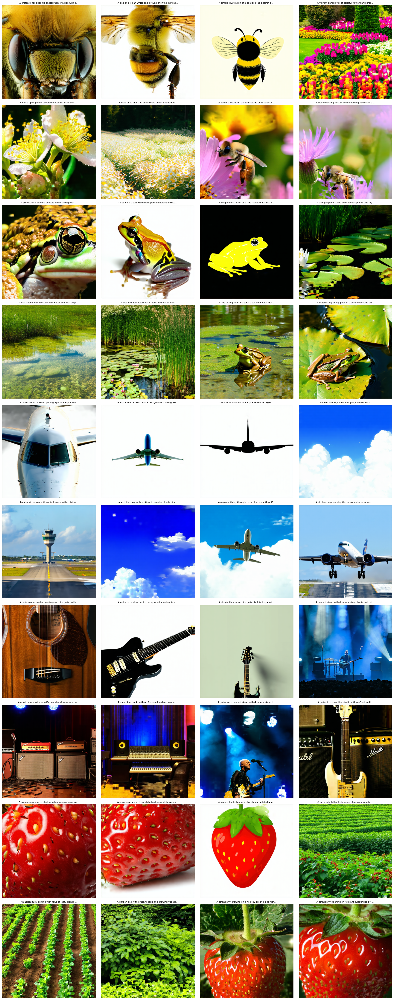


📚 REPORT:
• SEPARABILITÀ = Distanza media tra centroidi synsets (quanto sono distinti)
• Maggiore separabilità = Migliore distinzione semantica tra concetti

🏆 Top 5 Synset per i MIGLIORI 6 Layer (per separabilità semantica):
----------------------------------------------------------------------

1. layer4.2.relu (separabilità: 16.828):
   1. airplane: 3.3669 (da 8 immagini)
   2. guitar: 3.2708 (da 8 immagini)
   3. bee: 2.7210 (da 8 immagini)
   4. frog: 2.6922 (da 8 immagini)
   5. strawberry: 2.6121 (da 8 immagini)

2. layer4.1.relu (separabilità: 7.331):
   1. airplane: 2.2011 (da 8 immagini)
   2. guitar: 1.5823 (da 8 immagini)
   3. strawberry: 1.4935 (da 8 immagini)
   4. bee: 1.3906 (da 8 immagini)
   5. frog: 1.3889 (da 8 immagini)

3. layer4.2.conv1 (separabilità: 4.443):
   1. strawberry: 2.7643 (da 8 immagini)
   2. guitar: 2.5606 (da 8 immagini)
   3. bee: 2.3852 (da 8 immagini)
   4. frog: 2.2322 (da 8 immagini)
   5. airplane: 2.0180 (da 8 immagini)

4. layer4.0.relu (

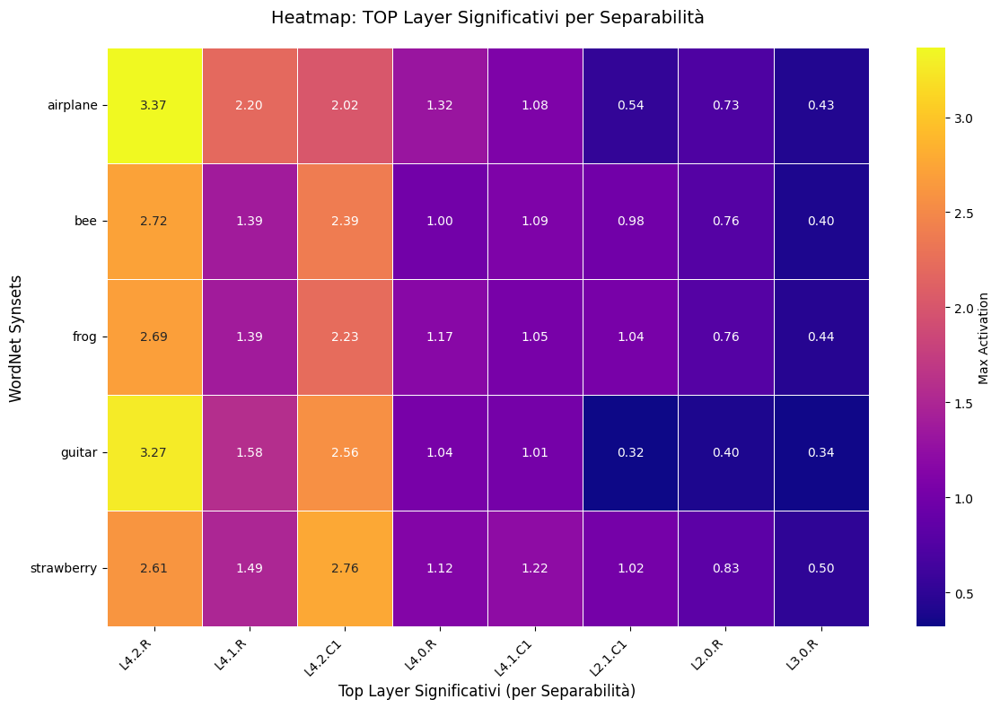

🔍 Estraendo probabilità ImageNet per analisi bias...
✅ Probabilità estratte per 40 immagini

🏆 Top 8 prompt per classe 'bee' (idx 309):
   1. A bee in a beautiful garden setting with colorful flowers an... → 0.9950
   2. A bee collecting nectar from blooming flowers in a sunny mea... → 0.9805
   3. A bee on a clean white background showing intricate wing and... → 0.9735
   4. A close-up of pollen-covered blossoms in a sunlit garden... → 0.2678
   5. A professional close-up photograph of a bee with detailed an... → 0.1645
   6. A simple illustration of a bee isolated against a plain back... → 0.0097
   7. A field of daisies and sunflowers under bright daylight... → 0.0047
   8. A vibrant garden full of colorful flowers and greenery... → 0.0044

🏆 Top 8 prompt per classe 'frog' (idx 31):
   1. A frog on a clean white background showing intricate skin pa... → 0.9348
   2. A frog resting on lily pads in a serene wetland environment... → 0.9020
   3. A simple illustration of a frog isolated

In [11]:
main_cnn_and_bias_shared()